# Part 0

Import the data.

The stock data is present locally, provided as part of "[The Complete Python and Machine Learning for Financial Analysis](https://www.udemy.com/course/ml-and-python-in-finance-real-cases-and-practical-solutions)" course from udemy.

In [57]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

Read the .csv stock data, provided as part of the course.

In [3]:
stocks_df = pd.read_csv("stock.csv")
stocks_df.head()

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.13,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.35,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.25,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.73,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.80,194.449997,180.520004,26.760000,318.590851,1314.500000


The stocks in the dataset are:
* Apple
* Boeing
* AT&T
* MGM Resorts International
* Amazon
* Tesla
* Google
* [S&P 500](https://en.wikipedia.org/wiki/List_of_S%26P_500_companies), which is not a stock but an index measuring the performance of 500 companies on the US stock exchange.


We make sure that the data is sorted chronologically.

In [4]:
stocks_df.sort_values(by='Date')

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


Having sorted the data, the date is set as the index.

In [5]:
stocks_df.set_index('Date', inplace=True)
stocks_df.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-12,60.198570,75.510002,30.120001,12.13,175.929993,180.550003,28.250000,313.644379,1295.500000
2012-01-13,59.972858,74.599998,30.070000,12.35,178.419998,179.160004,22.790001,311.328064,1289.089966
2012-01-17,60.671429,75.239998,30.250000,12.25,181.660004,180.000000,26.600000,313.116364,1293.670044
2012-01-18,61.301430,75.059998,30.330000,12.73,189.440002,181.070007,26.809999,315.273285,1308.040039
2012-01-19,61.107143,75.559998,30.420000,12.80,194.449997,180.520004,26.760000,318.590851,1314.500000


# Part 1: Exploratory data analysis and visualization

Show the datatypes of the columns:

In [6]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2159 entries, 2012-01-12 to 2020-08-11
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    2159 non-null   float64
 1   BA      2159 non-null   float64
 2   T       2159 non-null   float64
 3   MGM     2159 non-null   float64
 4   AMZN    2159 non-null   float64
 5   IBM     2159 non-null   float64
 6   TSLA    2159 non-null   float64
 7   GOOG    2159 non-null   float64
 8   sp500   2159 non-null   float64
dtypes: float64(9)
memory usage: 168.7+ KB


All columns have the same number of non-null entries, but better safe than sorry:

In [7]:
stocks_df.isnull().sum()

AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

Get a general description of the data:

In [8]:
stocks_df.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000,2159.000000
mean,140.819823,189.942700,35.162899,23.105743,915.665665,161.853001,259.600815,783.712512,2218.749554
std,70.827601,103.678586,3.207490,6.963847,697.838905,25.561938,210.988003,334.448057,537.321727
min,55.790001,67.239998,26.770000,7.140000,175.929993,94.769997,22.790001,278.481171,1278.040039
25%,89.165714,124.015000,33.040001,18.545000,316.490005,142.769997,184.595001,527.214416,1847.984985
50%,116.599998,142.419998,34.930000,23.780001,676.010010,156.949997,231.960007,737.599976,2106.629883
75%,175.019997,297.044998,37.419998,28.430000,1593.645019,185.974998,307.350006,1079.744995,2705.810059
max,455.609985,440.619995,43.470001,38.029999,3225.000000,215.800003,1643.000000,1568.489990,3386.149902


In order to visualize the stocks, a function is defined.

Input: The dataframe with the stocks, and plot title
Returns: Nothing, only produces the chart

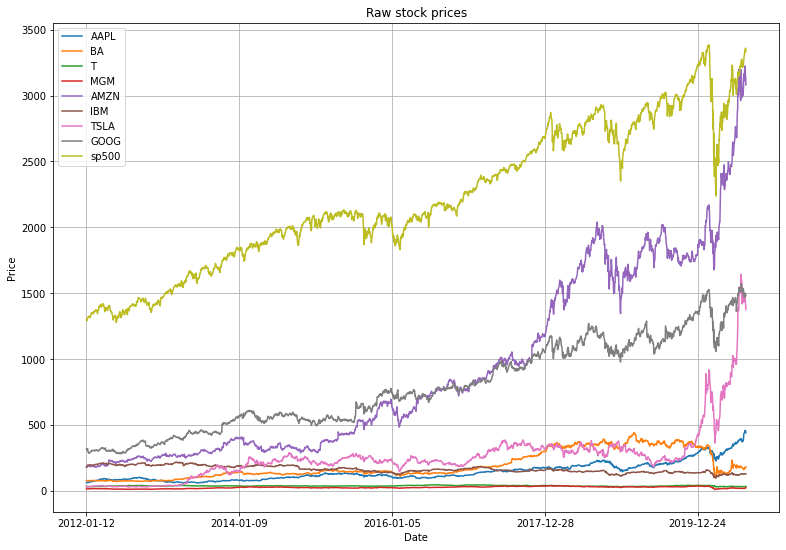

In [9]:
def visualize(df, title):
    df.plot(figsize=[13,9], grid=True, title=title, ylabel='Price')
    plt.show()

visualize(stocks_df, "Raw stock prices")

To properly compare stock returns, the values need to be normalized.
The starting value is used as a basis.

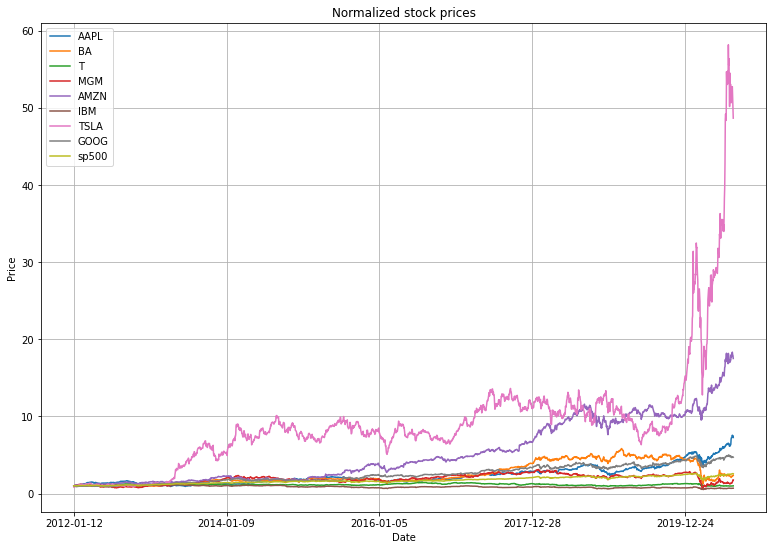

In [10]:
def normalize(df):
    normalized_df = df.copy()
    for col in df.columns: # Ignore the "Date" column
        normalized_df[col] = df[col]/df[col][0]
    return normalized_df

normalized_stocks = normalize(stocks_df)
visualize(normalized_stocks, "Normalized stock prices")

Comparing the two graphs shows that the stocks of Amazon and Tesla have increased in nominal value more than any other relative to 2012.

# Part 2: Interactive visualization

Even though the above graphs provide some insight, there is more that can be done with regards to visualizing the data.
Using plotly.express, interactive plots of the data are created, one for the raw data, one for the normalized prices.

In [11]:
def interactive_vis(df, title):
    fig = px.line(title=title)
    for col in df.columns:
        fig.add_scatter(x=df.index, y=df[col], name=col)
    fig.show()

In [12]:
interactive_vis(stocks_df, 'Raw stock prices')

In [13]:
interactive_vis(normalized_stocks, 'Normalized stock prices')

# Part 3: Stock daily returns

In this part the daily returns of the stocks are computed as the difference of the stock price between consecutive days.

In [14]:
daily_returns_df = stocks_df.diff()
daily_returns_df.drop([stocks_df.index[0]], inplace=True)# Because the first row is empty
daily_returns_df.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-13,-0.225712,-0.910004,-0.050001,0.22,2.490005,-1.389999,-5.459999,-2.316315,-6.410034
2012-01-17,0.698571,0.640000,0.180000,-0.10,3.240006,0.839996,3.809999,1.788300,4.580078
2012-01-18,0.630001,-0.180000,0.080000,0.48,7.779998,1.070007,0.209999,2.156921,14.369995
2012-01-19,-0.194287,0.500000,0.090000,0.07,5.009995,-0.550003,-0.049999,3.317566,6.459961
2012-01-20,-1.064285,-0.040001,0.090000,-0.16,-3.520004,8.000000,-0.160000,-26.689972,0.880005


It makes sense to also look at the daily returns as percentage changes.

In [15]:
pct_daily_returns_df = 100 * daily_returns_df/stocks_df[1:]
pct_daily_returns_df.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-13,-0.376357,-1.219845,-0.166282,1.781377,1.395586,-0.775842,-23.957871,-0.744011,-0.497253
2012-01-17,1.151400,0.850611,0.595041,-0.816327,1.783555,0.466664,14.323305,0.571130,0.354038
2012-01-18,1.027710,-0.239808,0.263765,3.770621,4.106840,0.590936,0.783286,0.684143,1.098590
2012-01-19,-0.317945,0.661726,0.295858,0.546875,2.576495,-0.304677,-0.186842,1.041325,0.491439
2012-01-20,-1.772542,-0.052967,0.294985,-1.265823,-1.843610,4.243581,-0.601504,-9.143505,0.066901


At this point, the greatest absolut and relative daily losses and gains can be computed.
This information is put into a dataframe.

In [16]:
rel_losses = pd.Series(pct_daily_returns_df.min(), name='Greatest relative losses')
abs_losses = pd.Series(daily_returns_df.min(), name='Greatest absolute losses')
rel_gains = pd.Series(pct_daily_returns_df.max(), name='Greatest relative gains')
abs_gains = pd.Series(pct_daily_returns_df.max(), name='Greatest absolute losses')
gains_losses = pd.DataFrame([rel_losses, abs_losses, rel_gains, abs_gains])
gains_losses

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Greatest relative losses,-14.764045,-31.317025,-10.181934,-50.634146,-12.356076,-14.745651,-23.957871,-12.486976,-13.615778
Greatest absolute losses,-35.759994,-41.929993,-3.190000,-5.190000,-187.959961,-17.149994,-152.359986,-135.400024,-324.890137
Greatest relative gains,10.698998,19.561518,9.109373,24.876847,13.603703,10.153589,19.610952,13.832051,8.577927
Greatest absolute losses,10.698998,19.561518,9.109373,24.876847,13.603703,10.153589,19.610952,13.832051,8.577927


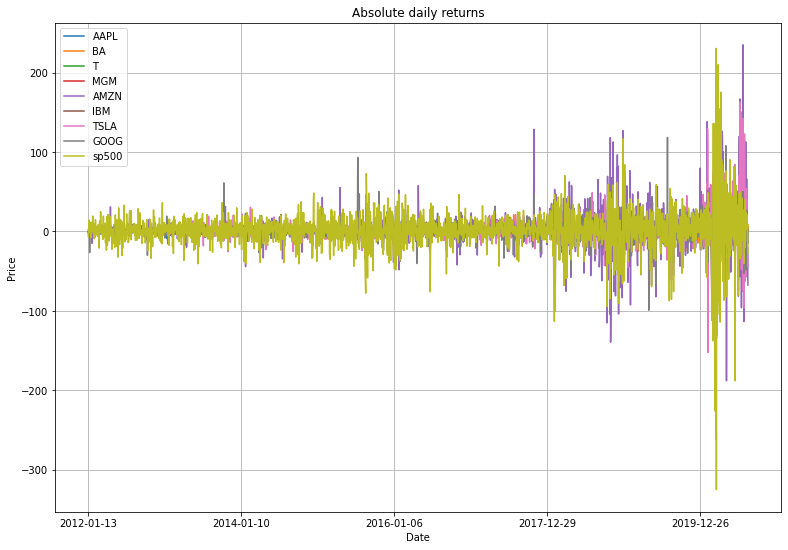

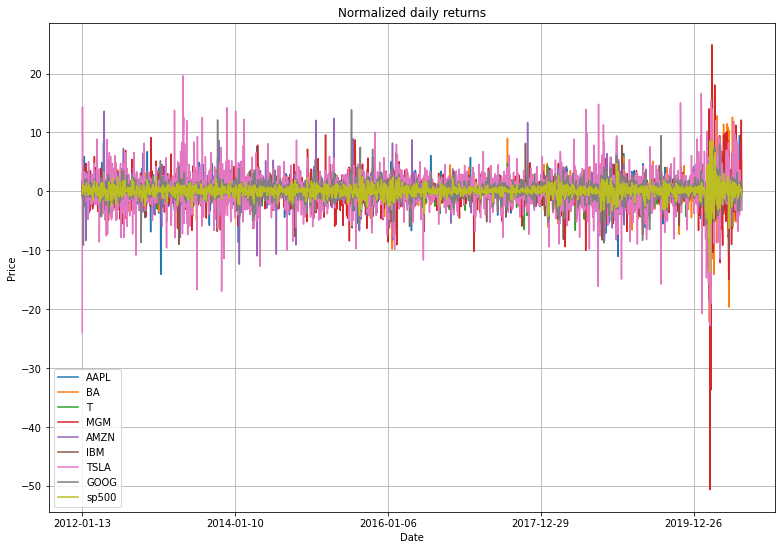

In [18]:
# Plots of the returns vs time

visualize(daily_returns_df, "Absolute daily returns")
visualize(pct_daily_returns_df, "Normalized daily returns")

In [19]:
# Interactive plots of the daily returns

interactive_vis(daily_returns_df, "Raw daily returns")
interactive_vis(pct_daily_returns_df, "Normalized daily returns")

Based on the market drop on March 2020, the following scenario is given:

Assume you bought 50 S&P shares and 50 Amazon shares on the 20 Feb 2020.
Determine your losses by March 23 2020.

In [38]:
losses = stocks_df[["sp500", "AMZN"]].loc[["2020-02-20", "2020-03-23"]].diff().dropna().sum(axis=1).values[0]
print("The losses of 50 S&P500 and 50 Amazon shares where $ " + str(losses.round(2)))

The losses of 50 S&P500 and 50 Amazon shares where $ -1386.1


# Part 4: Correlation between daily returns

At this point, the correlation between the observed stocks' returns.

           AAPL        BA         T       MGM      AMZN       IBM      TSLA  \
AAPL   1.000000  0.437339  0.377179  0.410819  0.581711  0.404860  0.375045   
BA     0.437339  1.000000  0.346664  0.467788  0.337527  0.384730  0.243731   
T      0.377179  0.346664  1.000000  0.327040  0.226553  0.423034  0.164653   
MGM    0.410819  0.467788  0.327040  1.000000  0.331637  0.391885  0.250715   
AMZN   0.581711  0.337527  0.226553  0.331637  1.000000  0.315791  0.412008   
IBM    0.404860  0.384730  0.423034  0.391885  0.315791  1.000000  0.207462   
TSLA   0.375045  0.243731  0.164653  0.250715  0.412008  0.207462  1.000000   
GOOG   0.624555  0.450661  0.368078  0.490132  0.637808  0.434214  0.386173   
sp500  0.747338  0.624000  0.596766  0.613808  0.586242  0.626597  0.404563   

           GOOG     sp500  
AAPL   0.624555  0.747338  
BA     0.450661  0.624000  
T      0.368078  0.596766  
MGM    0.490132  0.613808  
AMZN   0.637808  0.586242  
IBM    0.434214  0.626597  
TSLA   0.3861

<AxesSubplot:>

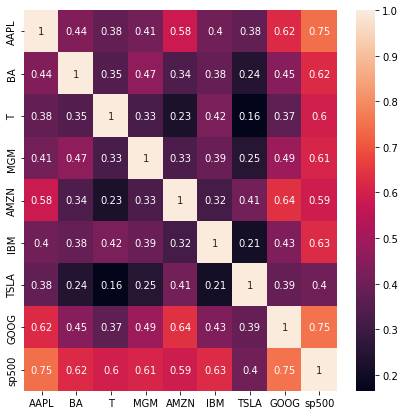

In [61]:
# Show the correlation matrix

corr_mat = daily_returns_df.corr()
print(corr_mat)
plt.figure(figsize=[7,7])
sns.heatmap(corr_mat, annot=True)

In [56]:
# Select the two stocks with the highest correlation between their daily returns
stock_1 = corr_mat[corr_mat<1].idxmax(axis=0)[0]
stock_2 = corr_mat[corr_mat<1][stock_1].idxmax(axis=1)
print("The two stocks with the highest correlated daily retuns are %s and %s." %(stock_1, stock_2))

The two stocks with the highest correlated daily retuns are sp500 and GOOG


# Part 5: Histograms of the daily returns

At this stage the volatility of the individual daily returns is examined.
First we look at the raw and then at the normalized daily returns.

array([[<AxesSubplot:title={'center':'AAPL'}>,
        <AxesSubplot:title={'center':'BA'}>,
        <AxesSubplot:title={'center':'T'}>],
       [<AxesSubplot:title={'center':'MGM'}>,
        <AxesSubplot:title={'center':'AMZN'}>,
        <AxesSubplot:title={'center':'IBM'}>],
       [<AxesSubplot:title={'center':'TSLA'}>,
        <AxesSubplot:title={'center':'GOOG'}>,
        <AxesSubplot:title={'center':'sp500'}>]], dtype=object)

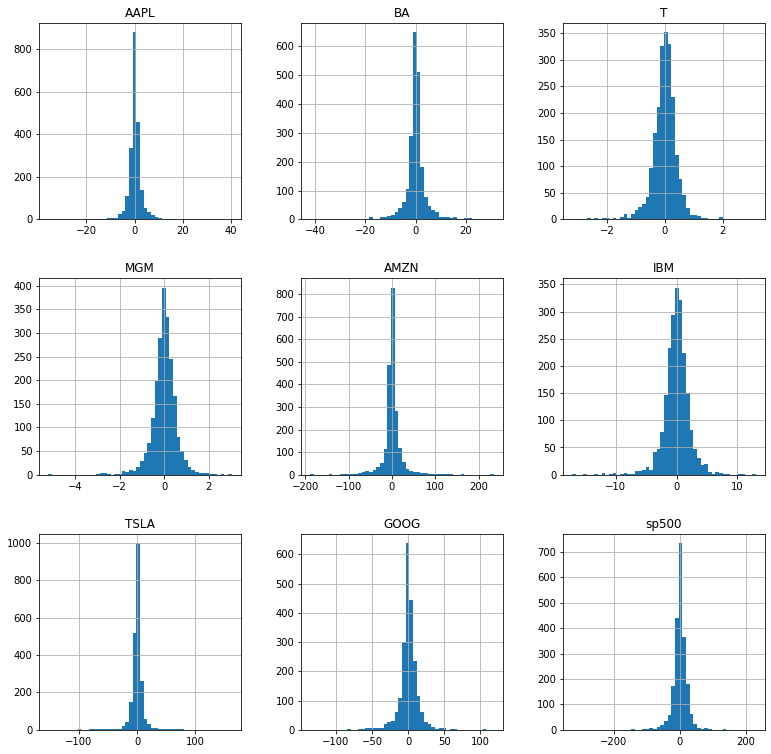

In [66]:
daily_returns_df.hist(bins=50, figsize=[13, 13])

From the raw returns, IBM and MGM seem to be the most risky.

array([[<AxesSubplot:title={'center':'AAPL'}>,
        <AxesSubplot:title={'center':'BA'}>,
        <AxesSubplot:title={'center':'T'}>],
       [<AxesSubplot:title={'center':'MGM'}>,
        <AxesSubplot:title={'center':'AMZN'}>,
        <AxesSubplot:title={'center':'IBM'}>],
       [<AxesSubplot:title={'center':'TSLA'}>,
        <AxesSubplot:title={'center':'GOOG'}>,
        <AxesSubplot:title={'center':'sp500'}>]], dtype=object)

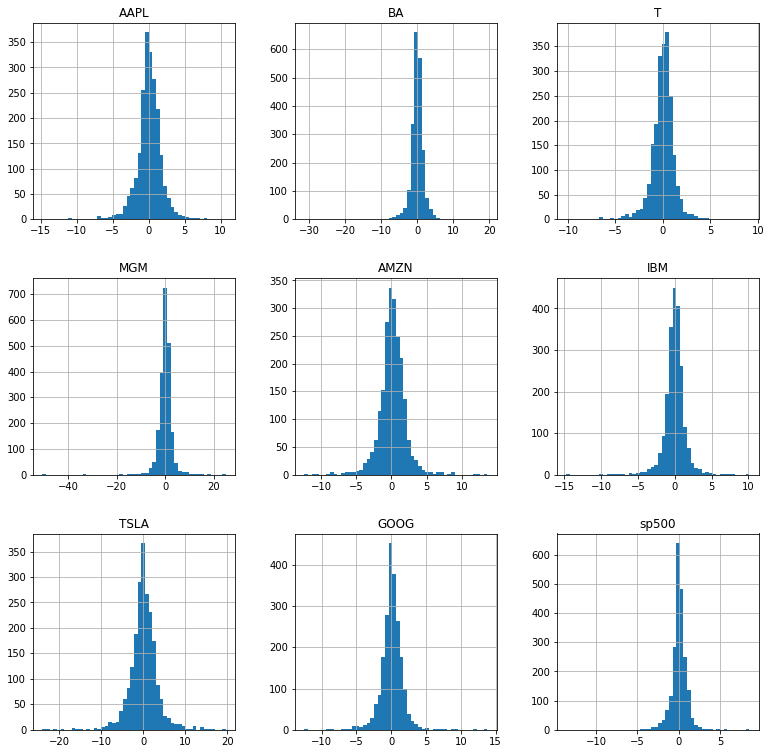

In [67]:
pct_daily_returns_df.hist(bins=50, figsize=[13,13])

The normalized returns indicate than the most volatile stocks are TSLA and AAPL.